In [2]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from torchvision import transforms, models
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import classification_report, confusion_matrix
import json
import matplotlib.pyplot as plt                           
import matplotlib.image as mpimg 
from torchinfo import summary
import  seaborn as sns


In [3]:
# Constants
TRAIN_SIZE = 480
VAL_SIZE = 65
TEST_SIZE = 60
BATCH_SIZE = 16
NUM_EPOCHS = 20
TRAINING_PATIENCE = 5
SAMPLE_DISPLAY = 5

# Dataset preparation
#### Data source link - https://data.mendeley.com/datasets/b6cj8k8x3g/3

### Functions to read dataset and display sample images

In [4]:
def dataset_read(path, samples_per_class=64):
    all_image_paths, all_labels = [], []

    # First, collect all image paths and labels
    for root, _, files in os.walk(path):
        for fname in files:
            # Check for common image file extensions
            if fname.lower().endswith(('.jpg', '.jpeg', '.PNG', '.JPG', '.bmp', '.tiff')):
                # The label is the name of the immediate parent folder
                label = os.path.basename(root)
                all_image_paths.append(os.path.join(root, fname))
                all_labels.append(label)

    # Create a DataFrame from all collected data
    full_df = pd.DataFrame({"Image_Path": all_image_paths, "Label": all_labels})

    if full_df.empty:
        print(f"No image files found in '{path}' or its subdirectories.")
        return pd.DataFrame({"Image_Path": [], "Label": []})

    # Group by label and sample N items from each group
    sampled_dfs = []
    for label, group_df in full_df.groupby("Label"):
        sampled_group = group_df.sample(n=min(len(group_df), samples_per_class), random_state=42)
        sampled_dfs.append(sampled_group)
        print(f"Class : '{label}', Count : {len(group_df['Image_Path'])}")
    
    # Concatenate all sampled dataframes back into one
    final_df = pd.concat(sampled_dfs).reset_index(drop=True)

    print(f"\nDataset read and sampled. Total samples: {len(final_df)} from {len(final_df['Label'].unique())} classes.")
    return final_df, len(all_labels)



def show_data_images(data, n_samples=3):
    labels = data['Label'].unique()
    n_classes = len(labels)
    fig, axs = plt.subplots(n_samples, n_classes, figsize=(3*n_classes, 3*n_samples))

    for col, label in enumerate(labels):
        group = data[data['Label'] == label].head(n_samples)
        for row, (_, row_data) in enumerate(group.iterrows()):
            img = mpimg.imread(row_data["Image_Path"])
            ax = axs[row, col] if n_samples > 1 else axs[col]
            ax.imshow(img)
            ax.axis('off')
            if row == 0:
                ax.set_title(label, fontsize=10)

    plt.tight_layout()
    plt.show()

### Loading and showing training data

In [5]:
train_data, num_classes = dataset_read("./TRAIN", TRAIN_SIZE)

Class : 'bacterial spot', Count : 597
Class : 'early blight', Count : 597
Class : 'healthy', Count : 489
Class : 'late blight', Count : 580
Class : 'leaf mold', Count : 597
Class : 'mosaic virus', Count : 596
Class : 'septoria spot', Count : 597
Class : 'yellow leaf curl', Count : 597

Dataset read and sampled. Total samples: 3840 from 8 classes.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840 entries, 0 to 3839
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Image_Path  3840 non-null   object
 1   Label       3840 non-null   object
dtypes: object(2)
memory usage: 60.1+ KB


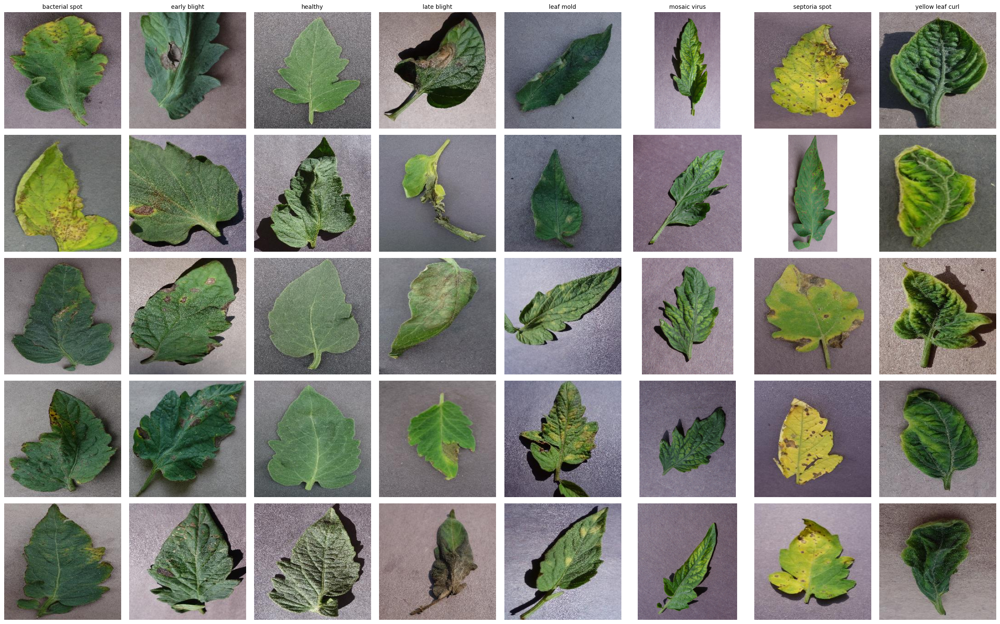

In [6]:
train_data.info()
show_data_images(train_data, 5)

### Loading and showing sample validation data

In [7]:
val_data, num_classes = dataset_read("./VAL", VAL_SIZE)


Class : 'bacterial spot', Count : 74
Class : 'early blight', Count : 74
Class : 'healthy', Count : 68
Class : 'late blight', Count : 72
Class : 'leaf mold', Count : 74
Class : 'mosaic virus', Count : 74
Class : 'septoria spot', Count : 74
Class : 'yellow leaf curl', Count : 74

Dataset read and sampled. Total samples: 520 from 8 classes.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Image_Path  520 non-null    object
 1   Label       520 non-null    object
dtypes: object(2)
memory usage: 8.3+ KB


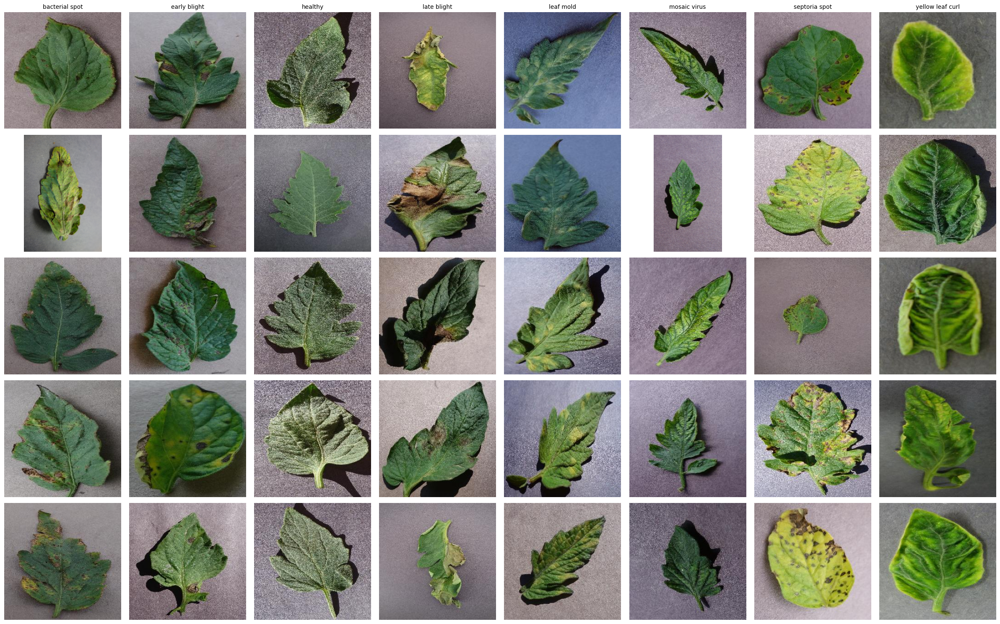

In [8]:
val_data.info()
show_data_images(val_data, 5)

### Data transformation


In [9]:
class PlantDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.transform = transform
        self.label_map = {label: idx for idx, label in enumerate(sorted(dataframe['Label'].unique()))}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.loc[idx, 'Image_Path']
        label = self.label_map[self.data.loc[idx, 'Label']]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

In [10]:
# Transforms with Augmentation - train data
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(p=0.5), # Added: Randomly flips the image vertically
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)), # Added: Random Gaussian blur
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = PlantDataset(train_data, train_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)


In [11]:
# Transforms - validation data
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_dataset = PlantDataset(val_data, val_transform)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)


# Model Setup

### Custom model

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class PlantDNet(nn.Module):
    def __init__(self, num_classes):
        super(PlantDNet, self).__init__()

        self.block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        
        self.block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.block5 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.block6 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(512, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)
        x = self.block6(x)
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x


In [13]:
custom_model = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if custom_model == True:
    model = PlantDNet(len(train_dataset.label_map))
else:
    model = models.mobilenet_v2(weights=True)
    num_ftrs = model.classifier[1].in_features
    model.classifier[1] = nn.Sequential(
        nn.Dropout(p=0.40),  # 40% dropout, adjust as needed
        nn.Linear(num_ftrs, len(train_dataset.label_map))
    )
    
model = model.to(device)

In [14]:
# Print model summary
summary(model, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
PlantDNet                                [1, 8]                    --
├─Sequential: 1-1                        [1, 32, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 32, 224, 224]         896
│    └─BatchNorm2d: 2-2                  [1, 32, 224, 224]         64
│    └─ReLU: 2-3                         [1, 32, 224, 224]         --
│    └─MaxPool2d: 2-4                    [1, 32, 112, 112]         --
├─Sequential: 1-2                        [1, 64, 56, 56]           --
│    └─Conv2d: 2-5                       [1, 64, 112, 112]         18,496
│    └─BatchNorm2d: 2-6                  [1, 64, 112, 112]         128
│    └─ReLU: 2-7                         [1, 64, 112, 112]         --
│    └─MaxPool2d: 2-8                    [1, 64, 56, 56]           --
├─Sequential: 1-3                        [1, 128, 28, 28]          --
│    └─Conv2d: 2-9                       [1, 128, 56, 56]          73,856
│    

# Loss and Optimizer with Scheduler


In [15]:
# Loss and Optimizer with Scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)

# Training Loop with logging and best checkpoint saving


In [16]:
# Training Loop with logging and best checkpoint saving
num_epochs = NUM_EPOCHS
training_stats = []
best_val_acc = 0.0
patience = TRAINING_PATIENCE  # Number of epochs to wait for improvement
counter = 0
torch.manual_seed(42)

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    train_acc = correct / total

    # Validation step
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)
    val_acc = val_correct / val_total

    # Log stats
    epoch_stats = {
        "epoch": epoch + 1,
        "train_loss": running_loss / len(train_loader),
        "train_acc": train_acc,
        "val_loss": val_loss / len(val_loader),
        "val_acc": val_acc
    }
    training_stats.append(epoch_stats)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}")

    # Save model if best so far
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        #torch.save(model.state_dict(), f"plantdoc_best_epoch{epoch+1}_acc{val_acc:.2f}.pt")
        print(f"Result: Model saved for epoch {epoch+1} with val acc {val_acc:.2f}")
                
        # Overwrite best model
        torch.save(model.state_dict(), f"plantd_model_{model.__class__.__name__}.pt")
        #print("Final model and reports saved.")
        counter = 0
    else:
        counter += 1
        print(f"Result: No improvement for {counter} epoch(s).")
        if counter >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs.")
            break
    
    # Step the scheduler with validation accuracy
    scheduler.step(val_acc)


Epoch 1/20, Train Acc: 45.86%, Val Acc: 66.54%
Result: Model saved for epoch 1 with val acc 0.67
Epoch 2/20, Train Acc: 55.78%, Val Acc: 69.62%
Result: Model saved for epoch 2 with val acc 0.70
Epoch 3/20, Train Acc: 60.86%, Val Acc: 77.69%
Result: Model saved for epoch 3 with val acc 0.78
Epoch 4/20, Train Acc: 62.14%, Val Acc: 76.92%
Result: No improvement for 1 epoch(s).
Epoch 5/20, Train Acc: 64.74%, Val Acc: 77.69%
Result: No improvement for 2 epoch(s).
Epoch 6/20, Train Acc: 67.27%, Val Acc: 73.65%
Result: No improvement for 3 epoch(s).
Epoch 7/20, Train Acc: 71.43%, Val Acc: 83.65%
Result: Model saved for epoch 7 with val acc 0.84
Epoch 8/20, Train Acc: 72.92%, Val Acc: 86.92%
Result: Model saved for epoch 8 with val acc 0.87
Epoch 9/20, Train Acc: 73.52%, Val Acc: 87.31%
Result: Model saved for epoch 9 with val acc 0.87
Epoch 10/20, Train Acc: 74.74%, Val Acc: 90.58%
Result: Model saved for epoch 10 with val acc 0.91
Epoch 11/20, Train Acc: 77.27%, Val Acc: 90.19%
Result: No im

# Save training stats


In [17]:
pd.DataFrame(training_stats).to_json(f"plant_disease_training_stats_{model.__class__.__name__}.json", orient='records')


# Evaluation

### Prepare test data

In [18]:
# Load test data

test_data, num_classes = dataset_read("./TEST", TEST_SIZE)

# Transforms  - test data
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_dataset = PlantDataset(test_data, test_transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)


Class : 'bacterial spot', Count : 74
Class : 'early blight', Count : 74
Class : 'healthy', Count : 62
Class : 'late blight', Count : 73
Class : 'leaf mold', Count : 74
Class : 'mosaic virus', Count : 74
Class : 'septoria spot', Count : 74
Class : 'yellow leaf curl', Count : 74

Dataset read and sampled. Total samples: 480 from 8 classes.


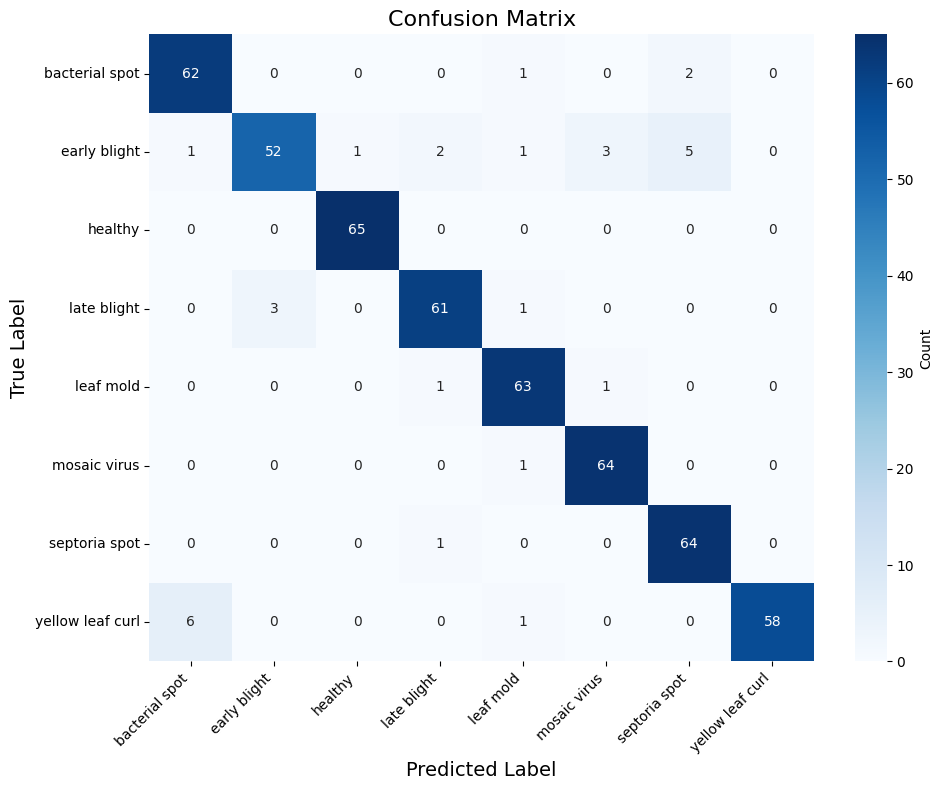


Overall Accuracy: 94.04%


In [19]:
# 7. Evaluation
model.eval()
y_true, y_pred = [], []
with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        y_true.extend(labels.numpy())
        y_pred.extend(preds.cpu().numpy())

label_names = sorted(val_data['Label'].unique())
report = classification_report(y_true, y_pred, target_names=label_names, output_dict=True)
cm = confusion_matrix(y_true, y_pred)


plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_names, yticklabels=label_names,
            cbar_kws={'label': 'Count'})

plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show()

# Print overall accuracy
correct_predictions = sum([cm[i][i] for i in range(len(cm))])
total_predictions = sum(sum(cm))
overall_accuracy = correct_predictions / total_predictions
print(f"\nOverall Accuracy: {overall_accuracy:.2%}")

with open(f"plant_disease_eval_report_{model.__class__.__name__}.json", "w") as f:
    json.dump({
        "classification_report": report,
        "confusion_matrix": cm.tolist(),
        "labels": label_names
    }, f, indent=2)



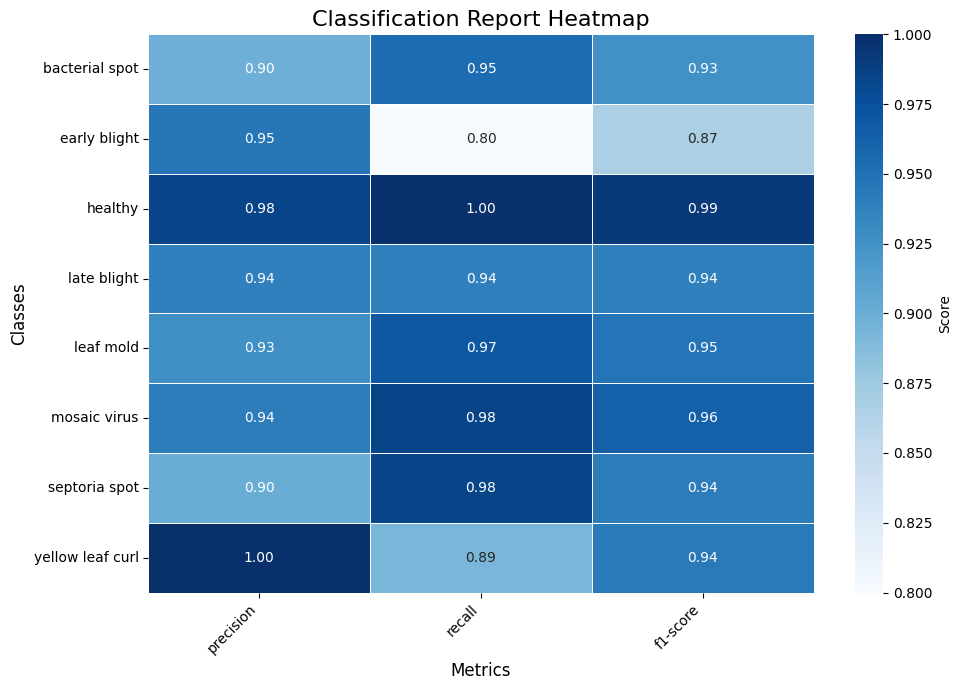

In [20]:
# Show graphical confusion matrix with heatmap
metrics_df = pd.DataFrame(report).iloc[:-1, :].T # Transpose to have classes as index and metrics as columns

metrics_to_plot = ['precision', 'recall', 'f1-score']
rows_to_drop = ['accuracy', 'macro avg', 'weighted avg']
metrics_df = metrics_df.drop(rows_to_drop, errors='ignore')

metrics_for_heatmap = metrics_df[metrics_to_plot]
# Plotting the Heatmap ---
plt.figure(figsize=(10, 7))
sns.heatmap(metrics_for_heatmap, annot=True, cmap='Blues', fmt=".2f", linewidths=.5, cbar_kws={'label': 'Score'})
plt.title('Classification Report Heatmap', fontsize=16)
plt.xlabel('Metrics', fontsize=12)
plt.ylabel('Classes', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()